# Install Library

In [1]:
pip install -U mplsoccer

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install statsbombpy

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


# Data Preparation

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer import Pitch, VerticalPitch, FontManager
from mplsoccer import Sbopen
from statsbombpy import sb

pd.set_option('display.max_columns', None)


In [6]:
sb.competitions()

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,9,27,Germany,1. Bundesliga,male,False,False,2015/2016,2023-12-12T07:43:33.436182,None,None,2023-12-12T07:43:33.436182
1,1267,107,Africa,African Cup of Nations,male,False,True,2023,2024-02-14T05:41:27.566989,None,None,2024-02-14T05:41:27.566989
2,16,4,Europe,Champions League,male,False,False,2018/2019,2023-03-07T12:20:48.118250,2021-06-13T16:17:31.694,None,2023-03-07T12:20:48.118250
3,16,1,Europe,Champions League,male,False,False,2017/2018,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-01-23T21:55:30.425330
4,16,2,Europe,Champions League,male,False,False,2016/2017,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
...,...,...,...,...,...,...,...,...,...,...,...,...
66,55,43,Europe,UEFA Euro,male,False,True,2020,2023-02-24T21:26:47.128979,2023-04-27T22:38:34.970148,2023-04-27T22:38:34.970148,2023-02-24T21:26:47.128979
67,35,75,Europe,UEFA Europa League,male,False,False,1988/1989,2023-06-18T19:28:39.443883,2021-06-13T16:17:31.694,None,2023-06-18T19:28:39.443883
68,53,106,Europe,UEFA Women's Euro,female,False,True,2022,2023-10-24T03:36:54.066267,2023-10-24T03:37:29.085948,2023-10-24T03:37:29.085948,2023-10-24T03:36:54.066267
69,72,107,International,Women's World Cup,female,False,True,2023,2023-12-12T14:06:50.626363,2023-12-12T14:12:41.561162,2023-12-12T14:12:41.561162,2023-12-12T14:06:50.626363


In [7]:
parser = Sbopen()
df_match = parser.match(competition_id=2, season_id=27)
df_match.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 52 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   match_id                         380 non-null    int64         
 1   match_date                       380 non-null    datetime64[ns]
 2   kick_off                         380 non-null    datetime64[ns]
 3   home_score                       380 non-null    int64         
 4   away_score                       380 non-null    int64         
 5   match_status                     380 non-null    object        
 6   match_status_360                 380 non-null    object        
 7   last_updated                     380 non-null    datetime64[ns]
 8   last_updated_360                 380 non-null    datetime64[ns]
 9   match_week                       380 non-null    int64         
 10  competition_id                   380 non-null    int64        

In [8]:
df_match.head(380)

,match_id,match_date,kick_off,home_score,away_score,match_status,match_status_360,last_updated,last_updated_360,match_week,competition_id,country_name,competition_name,season_id,season_name,home_team_id,home_team_name,home_team_gender,home_team_group,home_team_country_id,home_team_country_name,home_team_managers_id,home_team_managers_name,home_team_managers_nickname,home_team_managers_dob,home_team_managers_country_id,home_team_managers_country_name,away_team_id,away_team_name,away_team_gender,away_team_group,away_team_country_id,away_team_country_name,away_team_managers_id,away_team_managers_name,away_team_managers_nickname,away_team_managers_dob,away_team_managers_country_id,away_team_managers_country_name,metadata_data_version,metadata_shot_fidelity_version,metadata_xy_fidelity_version,competition_stage_id,competition_stage_name,stadium_id,stadium_name,stadium_country_id,stadium_country_name,referee_id,referee_name,referee_country_id,referee_country_name
0,3754058,2016-01-02,2016-01-02 16:00:00,0,0,available,processing,2021-10-29 23:44:19.940296,2021-06-12 16:17:31.694,20,2,England,Premier League,27,2015/2016,22,Leicester City,male,None,68,England,60,Claudio Ranieri,Claudio Ranieri,1951-10-20,112,Italy,28,AFC Bournemouth,male,None,68,England,38,Eddie Howe,Eddie Howe,1977-11-29,68,England,1.1.0,2,2,1,Regular Season,20,King Power Stadium,68,England,5,Andre Marriner,68,England
1,3754245,2015-10-17,2015-10-17 16:00:00,1,0,available,scheduled,2022-12-01 13:09:17.044015,2021-06-13 16:17:31.694,9,2,England,Premier League,27,2015/2016,27,West Bromwich Albion,male,None,68,England,300,Tony Pulis,Tony Pulis,1958-01-16,249,Wales,41,Sunderland,male,None,68,England,561,Sam Allardyce,Sam Allardyce,1954-10-19,68,England,1.1.0,2,2,1,Regular Season,33,The Hawthorns,68,England,4,Martin Atkinson,68,England
2,3754136,2015-12-19,2015-12-19 18:30:00,1,1,available,scheduled,2020-11-12 23:48:19.757269,2021-06-13 16:17:31.694,17,2,England,Premier League,27,2015/2016,37,Newcastle United,male,None,68,England,40,Steve McClaren,Steve McClaren,1961-05-03,68,England,59,Aston Villa,male,None,68,England,92,Rémi Garde,Rémi Garde,1966-04-03,78,France,1.1.0,2,2,1,Regular Season,4674,St. James'' Park,68,England,4,Martin Atkinson,68,England
3,3754037,2016-04-30,2016-04-30 16:00:00,2,1,available,processing,2021-07-07 17:59:57.456000,2021-06-12 16:17:31.694,36,2,England,Premier League,27,2015/2016,29,Everton,male,None,68,England,263,Roberto Martínez Montoliú,Roberto Martínez,1973-07-13,214,Spain,28,AFC Bournemouth,male,None,68,England,38,Eddie Howe,Eddie Howe,1977-11-29,68,England,1.1.0,2,2,1,Regular Season,12,Goodison Park,68,England,7,Neil Swarbrick,68,England
4,3754039,2016-02-13,2016-02-13 16:00:00,1,2,available,processing,2021-07-25 18:09:51.386000,2021-06-12 16:17:31.694,26,2,England,Premier League,27,2015/2016,31,Crystal Palace,male,None,68,England,382,Alan Pardew,Alan Pardew,1961-07-18,68,England,23,Watford,male,None,68,England,236,Enrique Sánchez Flores,Quique Sánchez Flores,1965-02-05,214,Spain,1.1.0,2,2,1,Regular Season,37,Selhurst Park,68,England,9,Robert Madley,68,England
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,3754020,2015-08-17,2015-08-17 21:00:00,1,0,available,scheduled,2022-07-08 21:26:42.829047,2021-06-13 16:17:31.694,2,2,England,Premier League,27,2015/2016,24,Liverpool,male,None,68,England,6,Brendan Rodgers,Brendan Rodgers,1973-01-26,169,Northern Ireland,28,AFC Bournemouth,male,None,68,England,38,Eddie Howe,Eddie Howe,1977-11-29,68,England,1.1.0,2,2,1,Regular Season,6,Anfield,68,England,2,Craig Pawson,68,England
376,3754267,2015-08-15,2015-08-15 16:00:00,0,0,available,scheduled,2020-07-29 05:00:00.000000,2021-06-13 16:17:31.694,2,2,England,Premier League,27,2015/2016,23,Watford,male,None,68,England,236,Enrique Sánchez Flores,Quique Sánchez Flores,1965-02-05,214,Spain,27,We

In [9]:
df_match.to_csv('Match.csv', index=False)

In [10]:
# iterate through all matches to get the events data
df_matches = {}
for i, id in enumerate(df_match['match_id']):
  df_matches[id] = {}
  df_matches[id]['event'], df_matches[id]['related'], df_matches[id]['freeze'], df_matches[id]['tactic'] = parser.event(id)

In [11]:
# example events data, filtered to shots only
df_matches[3754058]['event'][df_matches[3754058]['event']['type_name'] == 'Shot'].head()

,id,index,period,timestamp,minute,second,possession,duration,match_id,type_id,type_name,possession_team_id,possession_team_name,play_pattern_id,play_pattern_name,team_id,team_name,tactics_formation,player_id,player_name,position_id,position_name,pass_recipient_id,pass_recipient_name,pass_length,pass_angle,pass_height_id,pass_height_name,end_x,end_y,sub_type_id,sub_type_name,body_part_id,body_part_name,x,y,under_pressure,pass_switch,outcome_id,outcome_name,aerial_won,counterpress,pass_assisted_shot_id,pass_shot_assist,shot_statsbomb_xg,shot_key_pass_id,technique_id,technique_name,goalkeeper_position_id,goalkeeper_position_name,off_camera,out,pass_cross,pass_cut_back,dribble_overrun,dribble_nutmeg,foul_committed_advantage,foul_won_advantage,ball_recovery_recovery_failure,foul_won_defensive,end_z,shot_first_time,foul_committed_offensive,pass_deflected,shot_one_on_one,foul_committed_card_id,foul_committed_card_name,substitution_replacement_id,substitution_replacement_name,foul_committed_penalty,foul_won_penalty
92,72596ffe-393e-4a75-82c6-5fb82ae36d4d,93,1,00:01:33.287000,1,33,4,0.271905,3754058,16,Shot,28,AFC Bournemouth,1,Regular Play,28,AFC Bournemouth,None,3463.0,Junior Stanislas,16.0,Left Midfield,NaN,NaN,NaN,NaN,NaN,NaN,109.7,30.1,87.0,Open Play,40.0,Right Foot,107.1,26.6,NaN,NaN,96.0,Blocked,NaN,NaN,NaN,NaN,0.020838,45ddfb48-fdda-40c3-990d-fb9ef6e8fee9,93.0,Normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,b2bae775-5dd8-45bf-9b84-191c7849f707,224,1,00:04:23.399000,4,23,9,0.236075,3754058,16,Shot,28,AFC Bournemouth,1,Regular Play,28,AFC Bournemouth,None,3346.0,Joshua King,23.0,Center Forward,NaN,NaN,NaN,NaN,NaN,NaN,114.5,52.6,87.0,Open Play,40.0,Right Foot,113.7,54.0,NaN,NaN,96.0,Blocked,NaN,NaN,NaN,NaN,0.034462,ab2aac8d-dcc9-48db-92a5-0034978138ad,93.0,Normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
439,7c4227e5-0759-4633-93ea-bbbe291bbd72,440,1,00:09:20.642000,9,20,16,0.770062,3754058,16,Shot,22,Leicester City,1,Regular Play,22,Leicester City,None,3814.0,Riyad Mahrez,12.0,Right Midfield,NaN,NaN,NaN,NaN,NaN,NaN,120.0,43.3,87.0,Open Play,38.0,Left Foot,115.7,50.5,1.0,NaN,98.0,Off T,NaN,NaN,NaN,NaN,0.035481,25c558b5-fe79-48d8-8bc7-e0462ba594cb,94.0,Overhead Kick,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.6,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
578,8e3a6f10-64e4-49bf-a157-16b15b552713,579,1,00:13:11.270000,13,11,20,0.884091,3754058,16,Shot,28,AFC Bournemouth,4,From Throw In,28,AFC Bournemouth,None,3346.0,Joshua King,23.0,Center Forward,NaN,NaN,NaN,NaN,NaN,NaN,120.0,46.0,87.0,Open Play,37.0,Head,113.9,38.6,NaN,NaN,98.0,Off T,NaN,NaN,NaN,NaN,0.383711,880f1a79-5a60-4133-8eee-24eb5b531539,93.0,Normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1169,3a5364b3-0b99-4271-a451-0a3033ad195d,1170,1,00:25:47.089000,25,47,47,0.826620,3754058,16,Shot,22,Leicester City,3,From Free Kick,22,Leicester City,None,3671.0,José Leonardo Ulloa,22.0,Right Center Forward,NaN,NaN,NaN,NaN,NaN,NaN,103.9,40.1,87.0,Open Play,40.0,Right Foot,96.7,47.2,NaN,NaN,101.0,Wayward,NaN,NaN,NaN,NaN,0.036740,NaN,91.0,Half Volley,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df_matches[3754058]['event'].shape

(3576, 71)

In [13]:
# types of shot play
df_matches[3754058]['event'][df_matches[3754058]['event']['type_name'] == 'Shot']['sub_type_name'].unique()

array(['Open Play', 'Penalty'], dtype=object)

In [14]:
# we'll take the location, outcome, and also the xG by Statsbomb to compare it to our model later
df_shot = pd.DataFrame(columns=['x', 'y', 'outcome_name', 'shot_statsbomb_xg'])

for id in df_match['match_id']:
  # we take the period <= 4 because statsbomb also record penalty shots in the penalty shoot-out stage, we won't be using those shots
  # for our first model, we'll only take open play shots because penalty shots tend to have way higher goal probability
  # we'll use the other shots scenario in our next model
  mask_shot = (df_matches[id]['event'].type_name == 'Shot') & (df_matches[id]['event'].period	<= 4) & (df_matches[id]['event'].sub_type_name	== 'Open Play')
  shots_temp = df_matches[id]['event'].loc[mask_shot, ['x', 'y', 'outcome_name', 'shot_statsbomb_xg']]
  df_shot = pd.concat([df_shot, shots_temp]).reset_index(drop=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\1248259341.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_shot = pd.concat([df_shot, shots_temp]).reset_index(drop=True)


In [15]:
df_shot.head(10)

,x,y,outcome_name,shot_statsbomb_xg
0,107.1,26.6,Blocked,0.020838
1,113.7,54.0,Blocked,0.034462
2,115.7,50.5,Off T,0.035481
3,113.9,38.6,Off T,0.383711
4,96.7,47.2,Wayward,0.036740
5,111.3,38.7,Post,0.575428
6,112.6,28.7,Off T,0.095998
7,112.1,32.8,Off T,0.047259
8,108.4,43.0,Off T,0.256448
9,114.2,27.2,Wayward,0.111973


In [16]:
len(df_shot)


9415

In [17]:
df_shot.to_csv('Shot.csv', index=False)

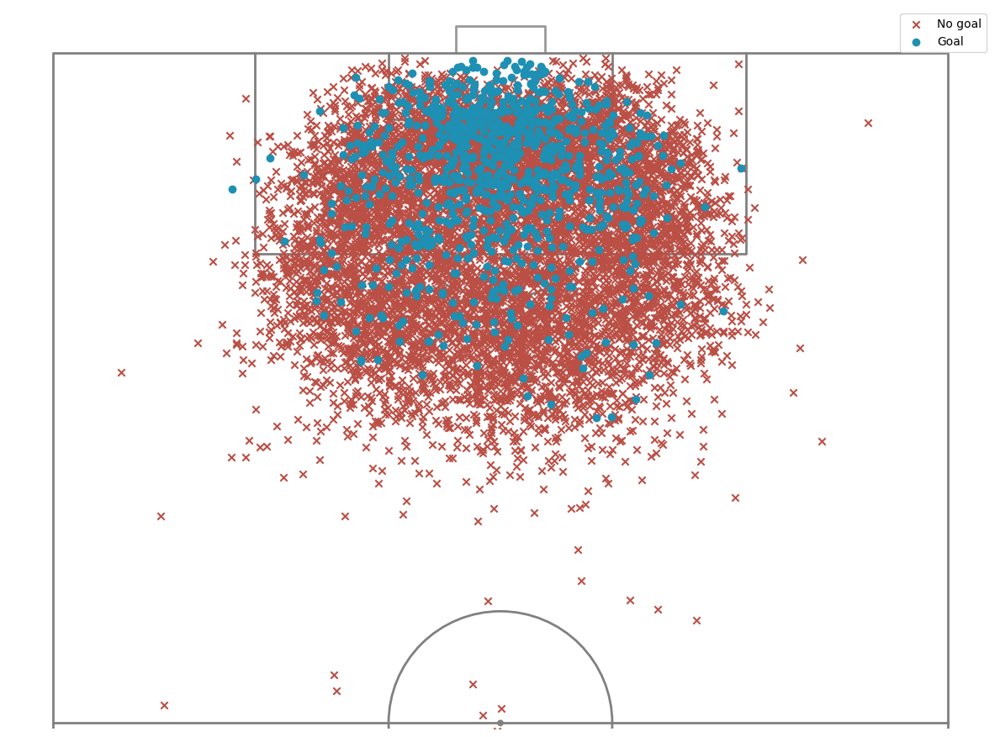

In [18]:
# visualizing shots

# filter goals / non-shot goals
df_goals = df_shot[df_shot.outcome_name == 'Goal'].copy()
df_non_goal_shots = df_shot[df_shot.outcome_name != 'Goal'].copy()

# setup the pitch
pitch = VerticalPitch(pad_bottom=0.5,  # pitch extends slightly below halfway line
                      half=True,  # half of a pitch
                      goal_type='box',
                      goal_alpha=0.8, pitch_color='white', line_color='grey')  # control the goal transparency

fig, ax = pitch.draw(figsize=(12, 10))

sc1 = pitch.scatter(df_non_goal_shots.x, df_non_goal_shots.y,
                    c='#ba4f45',
                    marker='x',
                    ax=ax, label="No goal")

sc2 = pitch.scatter(df_goals.x, df_goals.y,
                    c='#1d90b3',
                    marker='o',
                    ax=ax, label="Goal")

plt.legend(loc='best')
plt.show()

In [19]:
import math

def calculate_angle(x, y):
  # 44 and 36 is the location of each goal post
  g0 = [120, 44]
  p = [x, y]
  g1 = [120, 36]

  v0 = np.array(g0) - np.array(p)
  v1 = np.array(g1) - np.array(p)

  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
  return(abs(np.degrees(angle)))

def calculate_distance(x, y):
  x_dist = 120-x
  y_dist = 0
  if (y<36):
    y_dist = 36-y
  elif (y>44):
    y_dist = y-44
  return math.sqrt(x_dist**2 + y_dist**2)

In [20]:
new_features = ['x', 'y', 'outcome_name', 'sub_type_name', 'body_part_name', 'under_pressure', 'technique_name', 'shot_statsbomb_xg']
df_shot = pd.DataFrame(columns=new_features)

for id in df_match['match_id']:
  mask_shot = (df_matches[id]['event'].type_name == 'Shot') & (df_matches[id]['event'].period	<= 4)
  shots_temp = df_matches[id]['event'].loc[mask_shot, new_features]
  df_shot = pd.concat([df_shot, shots_temp]).reset_index(drop=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\2175752464.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_shot = pd.concat([df_shot, shots_temp]).reset_index(drop=True)


In [21]:
df_shot.head(10)

,x,y,outcome_name,sub_type_name,body_part_name,under_pressure,technique_name,shot_statsbomb_xg
0,107.1,26.6,Blocked,Open Play,Right Foot,NaN,Normal,0.020838
1,113.7,54.0,Blocked,Open Play,Right Foot,NaN,Normal,0.034462
2,115.7,50.5,Off T,Open Play,Left Foot,1.0,Overhead Kick,0.035481
3,113.9,38.6,Off T,Open Play,Head,NaN,Normal,0.383711
4,96.7,47.2,Wayward,Open Play,Right Foot,NaN,Half Volley,0.036740
5,111.3,38.7,Post,Open Play,Right Foot,NaN,Normal,0.575428
6,112.6,28.7,Off T,Open Play,Right Foot,NaN,Normal,0.095998
7,112.1,32.8,Off T,Open Play,Head,1.0,Normal,0.047259
8,108.4,43.0,Off T,Open Play,Right Foot,NaN,Normal,0.256448
9,114.2,27.2,Wayward,Open Play,Left Foot,NaN,Normal,0.111973


In [22]:
df_shot.to_csv('Shot Update.csv', index=False)

In [23]:
df_shot.body_part_name.unique()

array(['Right Foot', 'Left Foot', 'Head', 'Other'], dtype=object)

In [24]:
df_shot.outcome_name.unique()

array(['Blocked', 'Off T', 'Wayward', 'Post', 'Saved', 'Goal',
       'Saved Off Target', 'Saved to Post'], dtype=object)

In [25]:
df_shot.technique_name.unique()

array(['Normal', 'Overhead Kick', 'Half Volley', 'Volley',
       'Diving Header', 'Backheel', 'Lob'], dtype=object)

In [26]:
df_shot.sub_type_name.unique()

array(['Open Play', 'Penalty', 'Free Kick', 'Corner'], dtype=object)

In [27]:
replace_dict = {'Free Kick': 'set piece', 'Corner': 'set piece'}

# Mengganti nilai dalam kolom 'sub_type_name'
df_shot['sub_type_name'] = df_shot['sub_type_name'].replace(replace_dict)

In [28]:
df_shot['angle'] = df_shot.apply(lambda row:calculate_angle(row['x'], row['y']), axis=1)
df_shot['distance'] = df_shot.apply(lambda row:calculate_distance(row['x'], row['y']), axis=1)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))


In [29]:
def is_preferable_side(y, body_part_name):
  # what I mean by preferable side is if a right-footed player gets a chance from left side of the pitch (usually a left winger)
  # he could perform a finesse right-footed shot which I think has bigger probability of scoring instead of left-footed shot
  preferable_side = 0
  side = 'center'
  if (y<40):
    side = 'left'
  elif (y>40):
    side = 'right'

  if ((side=='left') & (body_part_name=='Right Foot')) | ((side=='right') & (body_part_name=='Left Foot')):
    preferable_side = 1
  return preferable_side

In [30]:
df_shot['preferable_side'] = df_shot.apply(lambda row:is_preferable_side(row['y'], row['body_part_name']), axis=1)

In [31]:
df_shot['header'] = df_shot.apply(lambda row:1 if row['body_part_name']=='Head' else 0, axis=1)

In [32]:
df_shot['under_pressure'] = df_shot['under_pressure'].fillna(0)
df_shot['under_pressure'] = df_shot['under_pressure'].astype(int)

In [33]:
# we'll create new column to define goal or not
df_shot['goal'] = df_shot.apply(lambda row:1 if row['outcome_name']=='Goal' else 0, axis=1)

In [34]:
df_shot.head(10)

,x,y,outcome_name,sub_type_name,body_part_name,under_pressure,technique_name,shot_statsbomb_xg,angle,distance,preferable_side,header,goal
0,107.1,26.6,Blocked,Open Play,Right Foot,0,Normal,0.020838,17.367371,15.961516,1,0,0
1,113.7,54.0,Blocked,Open Play,Right Foot,0,Normal,0.034462,12.920882,11.819052,0,0,0
2,115.7,50.5,Off T,Open Play,Left Foot,1,Overhead Kick,0.035481,16.968355,7.793587,1,0,0
3,113.9,38.6,Off T,Open Play,Head,0,Normal,0.383711,64.601862,6.100000,0,1,0
4,96.7,47.2,Wayward,Open Play,Right Foot,0,Half Volley,0.036740,17.852948,23.518716,0,0,0
5,111.3,38.7,Post,Open Play,Right Foot,0,Normal,0.575428,48.591040,8.700000,1,0,0
6,112.6,28.7,Off T,Open Play,Right Foot,0,Normal,0.095998,19.578558,10.394710,1,0,0
7,112.1,32.8,Off T,Open Play,Head,1,Normal,0.047259,32.751434,8.523497,0,1,0
8,108.4,43.0,Off T,Open Play,Right Foot,0,Normal,0.256448,36.035919,11.600000,0,0,0
9,114.2,27.2,Wayward,Open Play,Left Foot,0,Normal,0.111973,14.341889,10.539450,0,0,0


In [35]:
df_shot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9908 entries, 0 to 9907
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   x                  9908 non-null   float64
 1   y                  9908 non-null   float64
 2   outcome_name       9908 non-null   object 
 3   sub_type_name      9908 non-null   object 
 4   body_part_name     9908 non-null   object 
 5   under_pressure     9908 non-null   int32  
 6   technique_name     9908 non-null   object 
 7   shot_statsbomb_xg  9908 non-null   float64
 8   angle              9908 non-null   float64
 9   distance           9908 non-null   float64
 10  preferable_side    9908 non-null   int64  
 11  header             9908 non-null   int64  
 12  goal               9908 non-null   int64  
dtypes: float64(5), int32(1), int64(3), object(4)
memory usage: 967.7+ KB


In [36]:
# one hot encoding for techniques and sub types
df_shot = pd.get_dummies(df_shot, columns = ['technique_name'])
df_shot = pd.get_dummies(df_shot, columns = ['sub_type_name'])
df_shot = pd.get_dummies(df_shot, columns = ['body_part_name'])

In [37]:
df_shot['goal'] = df_shot.apply(lambda row:1 if row['outcome_name']=='Goal' else 0, axis=1)

In [38]:
df_shot.head()

,x,y,outcome_name,under_pressure,shot_statsbomb_xg,angle,distance,preferable_side,header,goal,technique_name_Backheel,technique_name_Diving Header,technique_name_Half Volley,technique_name_Lob,technique_name_Normal,technique_name_Overhead Kick,technique_name_Volley,sub_type_name_Open Play,sub_type_name_Penalty,sub_type_name_set piece,body_part_name_Head,body_part_name_Left Foot,body_part_name_Other,body_part_name_Right Foot
0,107.1,26.6,Blocked,0,0.020838,17.367371,15.961516,1,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
1,113.7,54.0,Blocked,0,0.034462,12.920882,11.819052,0,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
2,115.7,50.5,Off T,1,0.035481,16.968355,7.793587,1,0,0,False,False,False,False,False,True,False,True,False,False,False,True,False,False
3,113.9,38.6,Off T,0,0.383711,64.601862,6.100000,0,1,0,False,False,False,False,True,False,False,True,False,False,True,False,False,False
4,96.7,47.2,Wayward,0,0.036740,17.852948,23.518716,0,0,0,False,False,True,False,False,False,False,True,False,False,False,False,False,True


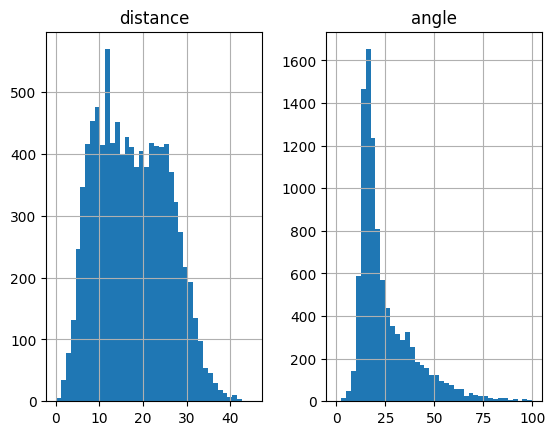

In [39]:
#plot distributions of shots by distance and angle side by side
fig, axes = plt.subplots(1, 2)
distance = df_shot.hist("distance",bins=40,range = (0,45),ax= axes[0])
angle = df_shot.hist("angle",bins=40, range = (0,100),ax=axes[1])

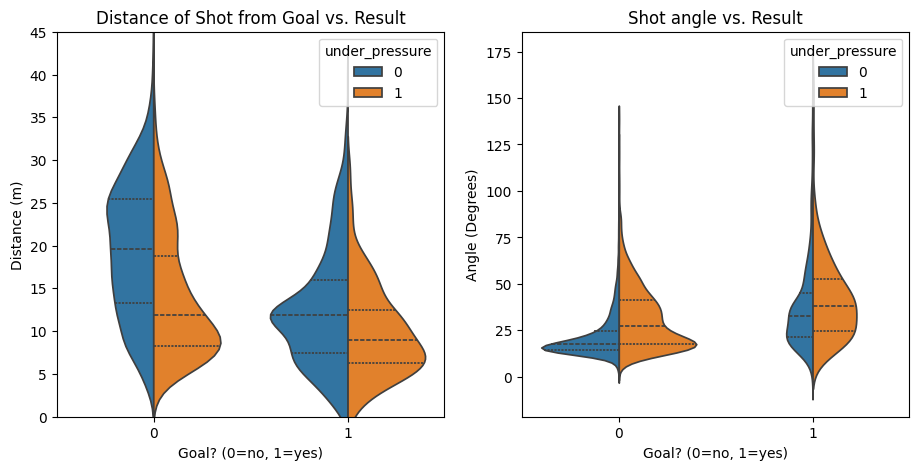

In [40]:
import seaborn as sns

fig, axes = plt.subplots(1, 2,figsize=(11, 5))
#the hue parameter splits plot by categorical data, in this case headers
shot_distance = sns.violinplot(x="goal", y="distance",hue='under_pressure',
                    data=df_shot, inner="quart",split=True,ax = axes[0])
shot_distance.set(xlabel="Goal? (0=no, 1=yes)",
       ylabel="Distance (m)",
       title="Distance of Shot from Goal vs. Result",ylim=(0, 45));

shot_ang = sns.violinplot(x="goal", y="angle",hue='under_pressure',
                    data=df_shot, inner="quart",split=True,ax = axes[1])
shot_ang.set(xlabel="Goal? (0=no, 1=yes)",
       ylabel="Angle (Degrees)",
       title="Shot angle vs. Result");

# Implementasi Metode Decision Tree

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import confusion_matrix, roc_curve, auc, roc_auc_score, accuracy_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import recall_score, accuracy_score, precision_score
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import classification_report, precision_recall_fscore_support,f1_score, mean_squared_error, r2_score

In [42]:
df_shot.head()

,x,y,outcome_name,under_pressure,shot_statsbomb_xg,angle,distance,preferable_side,header,goal,technique_name_Backheel,technique_name_Diving Header,technique_name_Half Volley,technique_name_Lob,technique_name_Normal,technique_name_Overhead Kick,technique_name_Volley,sub_type_name_Open Play,sub_type_name_Penalty,sub_type_name_set piece,body_part_name_Head,body_part_name_Left Foot,body_part_name_Other,body_part_name_Right Foot
0,107.1,26.6,Blocked,0,0.020838,17.367371,15.961516,1,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
1,113.7,54.0,Blocked,0,0.034462,12.920882,11.819052,0,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
2,115.7,50.5,Off T,1,0.035481,16.968355,7.793587,1,0,0,False,False,False,False,False,True,False,True,False,False,False,True,False,False
3,113.9,38.6,Off T,0,0.383711,64.601862,6.100000,0,1,0,False,False,False,False,True,False,False,True,False,False,True,False,False,False
4,96.7,47.2,Wayward,0,0.036740,17.852948,23.518716,0,0,0,False,False,True,False,False,False,False,True,False,False,False,False,False,True


In [43]:
df_shot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9908 entries, 0 to 9907
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   x                             9908 non-null   float64
 1   y                             9908 non-null   float64
 2   outcome_name                  9908 non-null   object 
 3   under_pressure                9908 non-null   int32  
 4   shot_statsbomb_xg             9908 non-null   float64
 5   angle                         9908 non-null   float64
 6   distance                      9908 non-null   float64
 7   preferable_side               9908 non-null   int64  
 8   header                        9908 non-null   int64  
 9   goal                          9908 non-null   int64  
 10  technique_name_Backheel       9908 non-null   bool   
 11  technique_name_Diving Header  9908 non-null   bool   
 12  technique_name_Half Volley    9908 non-null   bool   
 13  tec

In [44]:
df_shot.head()

,x,y,outcome_name,under_pressure,shot_statsbomb_xg,angle,distance,preferable_side,header,goal,technique_name_Backheel,technique_name_Diving Header,technique_name_Half Volley,technique_name_Lob,technique_name_Normal,technique_name_Overhead Kick,technique_name_Volley,sub_type_name_Open Play,sub_type_name_Penalty,sub_type_name_set piece,body_part_name_Head,body_part_name_Left Foot,body_part_name_Other,body_part_name_Right Foot
0,107.1,26.6,Blocked,0,0.020838,17.367371,15.961516,1,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
1,113.7,54.0,Blocked,0,0.034462,12.920882,11.819052,0,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
2,115.7,50.5,Off T,1,0.035481,16.968355,7.793587,1,0,0,False,False,False,False,False,True,False,True,False,False,False,True,False,False
3,113.9,38.6,Off T,0,0.383711,64.601862,6.100000,0,1,0,False,False,False,False,True,False,False,True,False,False,True,False,False,False
4,96.7,47.2,Wayward,0,0.036740,17.852948,23.518716,0,0,0,False,False,True,False,False,False,False,True,False,False,False,False,False,True


In [45]:
feature = [
    'under_pressure','angle','distance','preferable_side',
    'sub_type_name_set piece',	'sub_type_name_Open Play',	'sub_type_name_Penalty','body_part_name_Head','body_part_name_Left Foot','body_part_name_Other','body_part_name_Right Foot','shot_statsbomb_xg'
]

In [46]:
X = df_shot[feature]
y = df_shot.goal

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.5, random_state = 42)

In [48]:
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [49]:
y_pred = clf.predict(X_test)

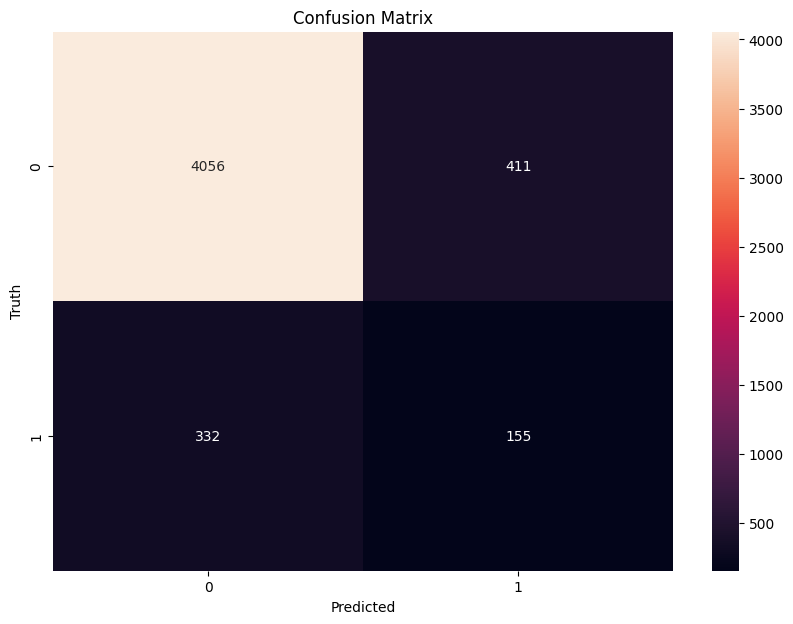

In [50]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Truth')

plt.show()

In [51]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy   :", accuracy)
precision = precision_score(y_test, y_pred)
print("Precision :", precision)
recall = recall_score(y_test, y_pred)
print("Recall    :", recall)

Accuracy   : 0.8500201857085183
Precision : 0.27385159010600707
Recall    : 0.3182751540041068


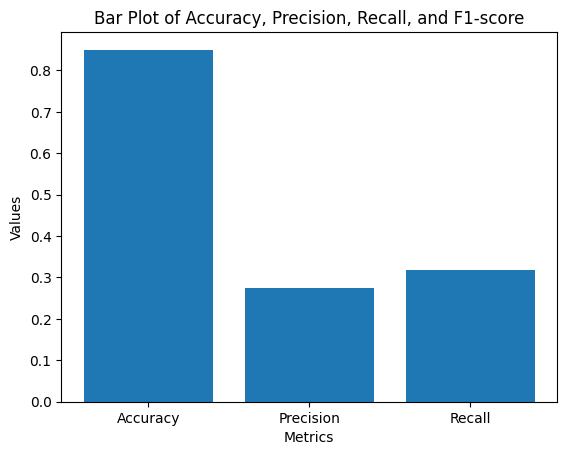

In [52]:
metrics = ['Accuracy', 'Precision', 'Recall']

# Nilai metrik
values = [accuracy, precision, recall]

# Membuat bar plot
plt.bar(metrics, values)

# Menambahkan judul dan label
plt.title('Bar Plot of Accuracy, Precision, Recall, and F1-score')
plt.xlabel('Metrics')
plt.ylabel('Values')

# Menampilkan plot
plt.show()

In [53]:
import graphviz
dot_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(dot_data)

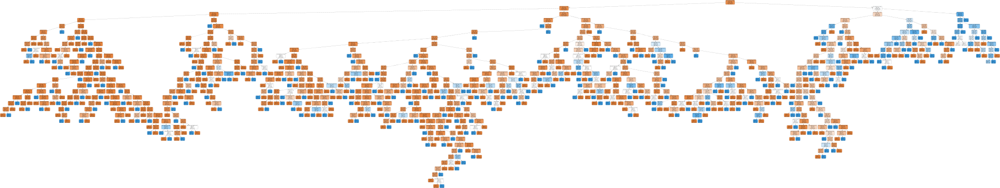

In [54]:
dot_data = tree.export_graphviz(clf, out_file=None,
                     feature_names=feature,
                     class_names=['No Goal','Goal'],
                     filled=True, rounded=True,
                     special_characters=True)
graph = graphviz.Source(dot_data)
graph

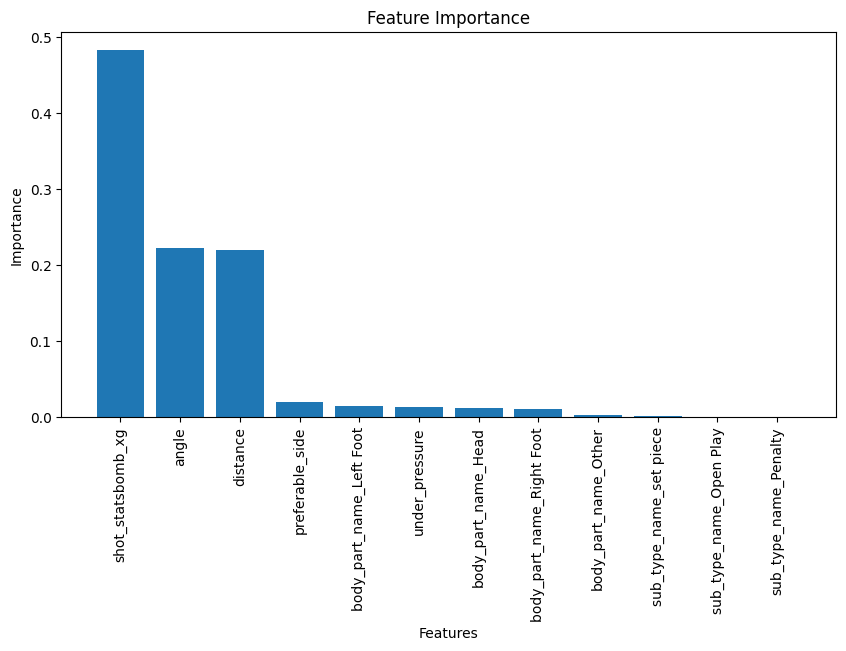

In [55]:
importances = clf.feature_importances_

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Mengurutkan DataFrame berdasarkan Importance
feature_importance = feature_importance.sort_values('Importance', ascending=False)

# Membuat plot
plt.figure(figsize=(10, 5))
plt.bar(feature_importance['Feature'], feature_importance['Importance'])
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.xticks(rotation=90)
plt.show()

# Optimalisasi Performa Decision Tree

Dengan Gini

In [56]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=0)

In [57]:
# fit the model
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=0)

In [58]:
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, random_state=0,
            splitter='best')

DecisionTreeClassifier(max_depth=4, random_state=0)

In [59]:
y_pred_gini = clf_gini.predict(X_test)

In [60]:
print('Model accuracy score with criterion gini index: {0:0.4f}'. format(accuracy_score(y_test, y_pred_gini)))

Model accuracy score with criterion gini index: 0.9098


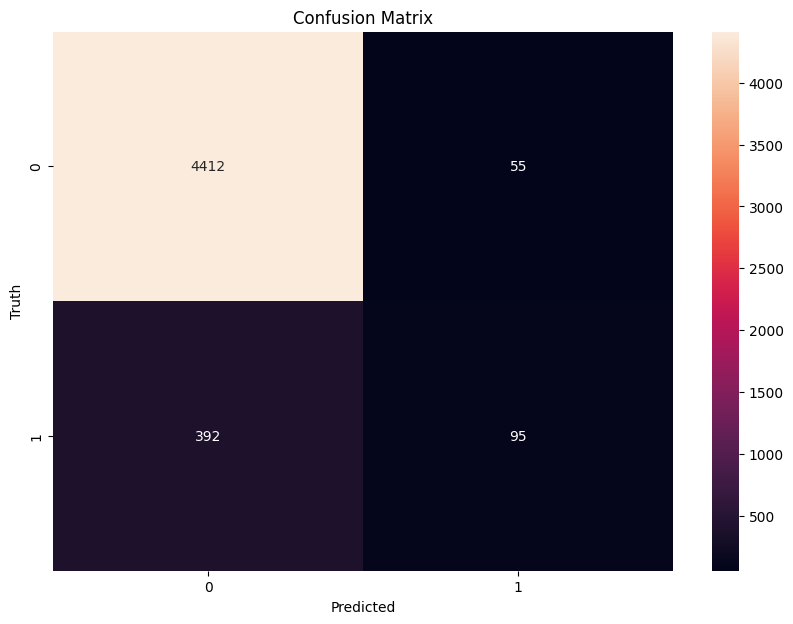

In [61]:
cm = confusion_matrix(y_test, y_pred_gini)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Truth')

plt.show()

In [62]:
accuracy = accuracy_score(y_test, y_pred_gini)
recall = recall_score(y_test, y_pred_gini, average='weighted')
precision = precision_score(y_test, y_pred_gini, average='weighted')

print('Accuracy: {0:0.4f}'. format (accuracy))
print('Recall: {0:0.4f}'. format (recall))
print('Precision: {0:0.4f}'. format (precision))

Accuracy: 0.9098
Recall: 0.9098
Precision: 0.8904


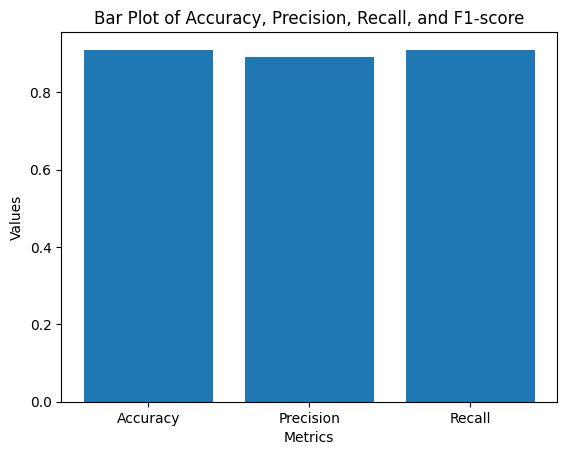

In [63]:
metrics = ['Accuracy', 'Precision', 'Recall']

# Nilai metrik
values = [accuracy, precision, recall]

# Membuat bar plot
plt.bar(metrics, values)

# Menambahkan judul dan label
plt.title('Bar Plot of Accuracy, Precision, Recall, and F1-score')
plt.xlabel('Metrics')
plt.ylabel('Values')

# Menampilkan plot
plt.show()

In [64]:
y_pred_train_gini = clf_gini.predict(X_train)

y_pred_train_gini

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [65]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train_gini)))

Training-set accuracy score: 0.9170


In [66]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9170
Test set score: 0.9098


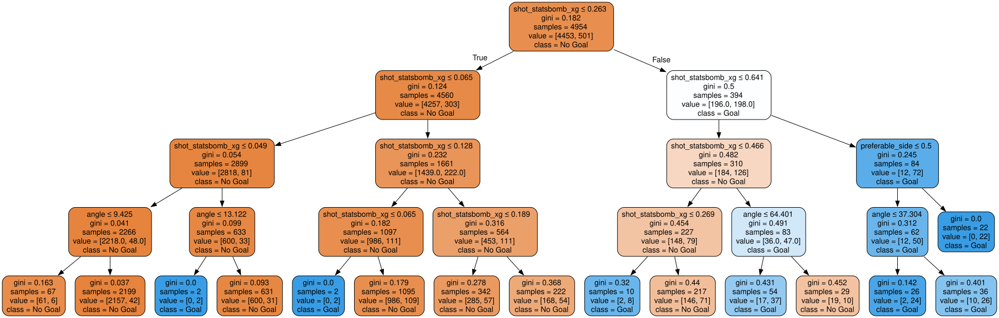

In [67]:
dot_data = tree.export_graphviz(clf_gini, out_file=None,
                     feature_names=feature,
                     class_names=['No Goal','Goal'],
                     filled=True, rounded=True,
                     special_characters=True)
graph = graphviz.Source(dot_data)
graph

Denagn Entropy

In [68]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)

In [69]:
# fit the model
clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)

In [70]:
DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, random_state=0,
            splitter='best')

DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)

In [71]:
y_pred_en = clf_en.predict(X_test)

In [72]:
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred_en)))

Model accuracy score with criterion entropy: 0.9106


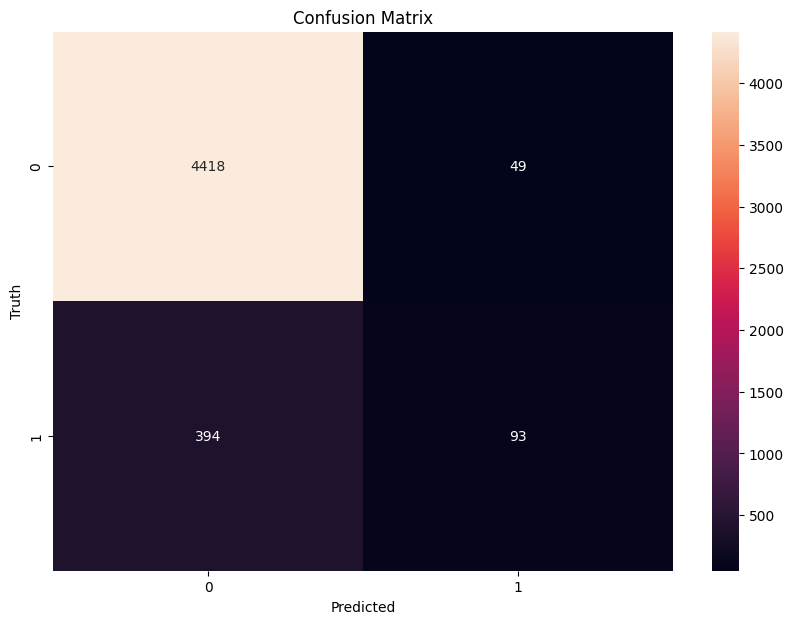

In [73]:
cm = confusion_matrix(y_test, y_pred_en)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Truth')

plt.show()

In [74]:
accuracy = accuracy_score(y_test, y_pred_en)
recall = recall_score(y_test, y_pred_en, average='weighted')
precision = precision_score(y_test, y_pred_en, average='weighted')

print('Accuracy: {0:0.4f}'. format (accuracy))
print('Recall: {0:0.4f}'. format (recall))
print('Precision: {0:0.4f}'. format (precision))

Accuracy: 0.9106
Recall: 0.9106
Precision: 0.8922


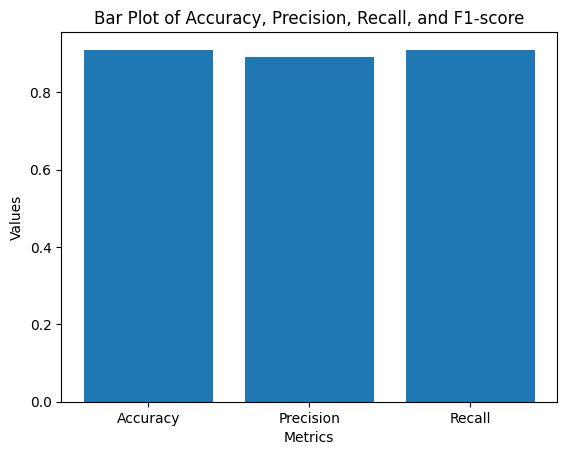

In [75]:
metrics = ['Accuracy', 'Precision', 'Recall']

# Nilai metrik
values = [accuracy, precision, recall]

# Membuat bar plot
plt.bar(metrics, values)

# Menambahkan judul dan label
plt.title('Bar Plot of Accuracy, Precision, Recall, and F1-score')
plt.xlabel('Metrics')
plt.ylabel('Values')

# Menampilkan plot
plt.show()

In [76]:
y_pred_train_en = clf_en.predict(X_train)

y_pred_train_en

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [77]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train_en)))

Training-set accuracy score: 0.9158


In [78]:
print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9158
Test set score: 0.9106


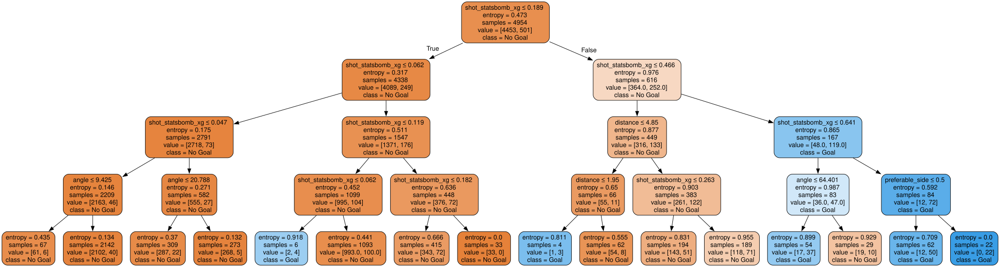

In [79]:
dot_data = tree.export_graphviz(clf_en, out_file=None,
                     feature_names=feature,
                     class_names=['No Goal','Goal'],
                     filled=True, rounded=True,
                     special_characters=True)
graph = graphviz.Source(dot_data)
graph

# Evaluasi Pertandingan

In [80]:
df_shot.head()

,x,y,outcome_name,under_pressure,shot_statsbomb_xg,angle,distance,preferable_side,header,goal,technique_name_Backheel,technique_name_Diving Header,technique_name_Half Volley,technique_name_Lob,technique_name_Normal,technique_name_Overhead Kick,technique_name_Volley,sub_type_name_Open Play,sub_type_name_Penalty,sub_type_name_set piece,body_part_name_Head,body_part_name_Left Foot,body_part_name_Other,body_part_name_Right Foot
0,107.1,26.6,Blocked,0,0.020838,17.367371,15.961516,1,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
1,113.7,54.0,Blocked,0,0.034462,12.920882,11.819052,0,0,0,False,False,False,False,True,False,False,True,False,False,False,False,False,True
2,115.7,50.5,Off T,1,0.035481,16.968355,7.793587,1,0,0,False,False,False,False,False,True,False,True,False,False,False,True,False,False
3,113.9,38.6,Off T,0,0.383711,64.601862,6.100000,0,1,0,False,False,False,False,True,False,False,True,False,False,True,False,False,False
4,96.7,47.2,Wayward,0,0.036740,17.852948,23.518716,0,0,0,False,False,True,False,False,False,False,True,False,False,False,False,False,True


In [81]:
df_shot.columns

Index(['x', 'y', 'outcome_name', 'under_pressure', 'shot_statsbomb_xg',
       'angle', 'distance', 'preferable_side', 'header', 'goal',
       'technique_name_Backheel', 'technique_name_Diving Header',
       'technique_name_Half Volley', 'technique_name_Lob',
       'technique_name_Normal', 'technique_name_Overhead Kick',
       'technique_name_Volley', 'sub_type_name_Open Play',
       'sub_type_name_Penalty', 'sub_type_name_set piece',
       'body_part_name_Head', 'body_part_name_Left Foot',
       'body_part_name_Other', 'body_part_name_Right Foot'],
      dtype='object')

In [82]:
X_cols = ['under_pressure', 'angle', 'distance',
       'preferable_side', 'header', 'technique_name_Backheel',
       'technique_name_Diving Header', 'technique_name_Half Volley',
       'technique_name_Lob', 'technique_name_Normal',
       'technique_name_Overhead Kick', 'technique_name_Volley',
       'sub_type_name_set piece',
       'sub_type_name_Open Play', 'sub_type_name_Penalty']
X = df_shot[X_cols]
X.head()

,under_pressure,angle,distance,preferable_side,header,technique_name_Backheel,technique_name_Diving Header,technique_name_Half Volley,technique_name_Lob,technique_name_Normal,technique_name_Overhead Kick,technique_name_Volley,sub_type_name_set piece,sub_type_name_Open Play,sub_type_name_Penalty
0,0,17.367371,15.961516,1,0,False,False,False,False,True,False,False,False,True,False
1,0,12.920882,11.819052,0,0,False,False,False,False,True,False,False,False,True,False
2,1,16.968355,7.793587,1,0,False,False,False,False,False,True,False,False,True,False
3,0,64.601862,6.100000,0,1,False,False,False,False,True,False,False,False,True,False
4,0,17.852948,23.518716,0,0,False,False,True,False,False,False,False,False,True,False


In [83]:
y = df_shot['goal']

In [84]:
X.shape

(9908, 15)

In [85]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score

tree_model = DecisionTreeClassifier(max_depth=3, min_samples_split=20)
tree_model.fit(X, y)

# Memprediksi probabilitas kelas dengan model Decision Tree
y_pred_tree = tree_model.predict_proba(X)[:, 1]

# Menghitung skor R^2
r2_tree = r2_score(y, y_pred_tree)
print(f"R^2 score for Decision Tree model: {r2_tree}")

R^2 score for Decision Tree model: 0.12544787362109167


In [86]:
df_shot['xG_adv'] = y_pred_tree


In [87]:
r2 = r2_score(y, df_shot['shot_statsbomb_xg'])

In [88]:
df_shot['xG_adv'] = y_pred_tree

In [89]:
corr_cols = ['under_pressure', 'angle', 'distance',
       'preferable_side', 'header', 'technique_name_Backheel',
       'technique_name_Diving Header', 'technique_name_Half Volley',
       'technique_name_Lob', 'technique_name_Normal',
       'technique_name_Overhead Kick', 'technique_name_Volley',
       'sub_type_name_set piece',
       'sub_type_name_Open Play', 'sub_type_name_Penalty',
       ]

In [90]:
df_shot[corr_cols].corr().iloc[:,-1].sort_values()

sub_type_name_Open Play        -0.420744
distance                       -0.065747
under_pressure                 -0.050474
header                         -0.042377
technique_name_Half Volley     -0.037366
preferable_side                -0.033470
technique_name_Volley          -0.025532
sub_type_name_set piece        -0.019799
technique_name_Lob             -0.007763
technique_name_Overhead Kick   -0.007702
technique_name_Diving Header   -0.006575
technique_name_Backheel        -0.006356
technique_name_Normal           0.050895
angle                           0.071154
sub_type_name_Penalty           1.000000
Name: sub_type_name_Penalty, dtype: float64

In [91]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9908 entries, 0 to 9907
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   under_pressure                9908 non-null   int32  
 1   angle                         9908 non-null   float64
 2   distance                      9908 non-null   float64
 3   preferable_side               9908 non-null   int64  
 4   header                        9908 non-null   int64  
 5   technique_name_Backheel       9908 non-null   bool   
 6   technique_name_Diving Header  9908 non-null   bool   
 7   technique_name_Half Volley    9908 non-null   bool   
 8   technique_name_Lob            9908 non-null   bool   
 9   technique_name_Normal         9908 non-null   bool   
 10  technique_name_Overhead Kick  9908 non-null   bool   
 11  technique_name_Volley         9908 non-null   bool   
 12  sub_type_name_set piece       9908 non-null   bool   
 13  sub

In [92]:
def calculate_xg_adv(row):
  under_pressure = 0 if np.isnan(row['under_pressure']) else 1
  angle = calculate_angle(row['x'], row['y'])
  distance = calculate_distance(row['x'], row['y'])
  preferable_side = is_preferable_side(row['y'], row['body_part_name'])
  header = 1 if row['body_part_name']=='Head' else 0
  technique_name = {}
  sub_type_name = {}
  technique_name['Backheel'] = technique_name['Diving Header'] = 0
  technique_name['Half Volley'] = technique_name['Lob'] = 0
  technique_name['Normal'] = technique_name['Overhead Kick'] = 0
  technique_name['Volley'] = sub_type_name['set piece'] = 0
  sub_type_name['Open Play'] = 0
  sub_type_name['Penalty'] = 0
  technique_name[row['technique_name']] = 1
  sub_type_name[row['sub_type_name']] = 1
  X = [[under_pressure, angle, distance, preferable_side, header,
        technique_name['Backheel'], technique_name['Diving Header'],
        technique_name['Half Volley'], technique_name['Lob'],
        technique_name['Normal'], technique_name['Overhead Kick'],
        technique_name['Volley'], sub_type_name['set piece'],
        sub_type_name['Open Play'], sub_type_name['Penalty']]]
  xg = tree_model.predict_proba(X)[:, 1][0]
  return xg

In [93]:
# let's try to evaluate it on all matches and store it into dataframe
df_summary = df_match[['match_id','match_date','match_week', 'home_team_name', 'away_team_name']].copy()

home_goal = []
home_xg = []
home_xg_sb = []

away_goal = []
away_xg = []
away_xg_sb = []

for i, id in enumerate(df_match.match_id):
  df_evaluate = df_matches[id]['event'][df_matches[id]['event']['type_name'] == 'Shot']

  # take only open play
  evaluate_mask = (df_evaluate.type_name == 'Shot') & (df_evaluate.period	<= 4)
  df_evaluate = df_evaluate[evaluate_mask]

  # calculate xg per shot
  df_evaluate['our_xg'] = df_evaluate.apply(lambda row:calculate_xg_adv(row), axis=1)

  # home team
  df_home = df_evaluate[df_evaluate.team_name == df_match['home_team_name'][i]]
  home_goal.append(len(df_home[df_home.outcome_name == 'Goal']))
  home_xg.append(df_home.our_xg.sum())
  home_xg_sb.append(df_home.shot_statsbomb_xg.sum())

  # away team
  df_away = df_evaluate[df_evaluate.team_name == df_match['away_team_name'][i]]
  away_goal.append(len(df_away[df_away.outcome_name == 'Goal']))
  away_xg.append(df_away.our_xg.sum())
  away_xg_sb.append(df_away.shot_statsbomb_xg.sum())

df_summary['home_goal'] = home_goal
df_summary['home_xg'] = home_xg
df_summary['home_xg_sb'] = home_xg_sb

df_summary['away_goal'] = away_goal
df_summary['away_xg'] = away_xg
df_summary['away_xg_sb'] = away_xg_sb

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

In [94]:
df_summary[df_summary['away_team_name'] == 'Leicester City']

,match_id,match_date,match_week,home_team_name,away_team_name,home_goal,home_xg,home_xg_sb,away_goal,away_xg,away_xg_sb
21,3754146,2015-09-19,6,Stoke City,Leicester City,2,0.922018,1.324059,2,1.763954,1.611006
40,3754006,2015-10-31,11,West Bromwich Albion,Leicester City,2,2.169011,1.987063,3,1.390722,1.679065
41,3754023,2015-08-29,4,AFC Bournemouth,Leicester City,1,0.279505,0.300446,1,0.899872,0.828728
60,3754085,2015-12-05,15,Swansea City,Leicester City,0,1.162120,1.047635,3,1.971530,2.548385
100,3754166,2015-12-19,17,Everton,Leicester City,2,1.764502,1.691042,3,2.553014,2.370729
101,3754211,2015-11-21,13,Newcastle United,Leicester City,0,0.754207,0.430049,3,2.375417,3.173120
145,3754335,2015-10-03,8,Norwich City,Leicester City,1,1.601520,1.288597,2,2.530696,3.519109
159,3754302,2015-10-17,9,Southampton,Leicester City,2,1.543705,1.364069,2,2.544044,2.111764
163,3754343,2015-12-26,18,Liverpool,Leicester City,1,1.779276,1.777294,0,0.988752,0.801469
178,3754203,2015-08-15,2,West Ham United,Leicester City,1,0.822915,0.806373,2,1.134579,1.215113


In [95]:
df_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   match_id        380 non-null    int64         
 1   match_date      380 non-null    datetime64[ns]
 2   match_week      380 non-null    int64         
 3   home_team_name  380 non-null    object        
 4   away_team_name  380 non-null    object        
 5   home_goal       380 non-null    int64         
 6   home_xg         380 non-null    float64       
 7   home_xg_sb      380 non-null    float64       
 8   away_goal       380 non-null    int64         
 9   away_xg         380 non-null    float64       
 10  away_xg_sb      380 non-null    float64       
dtypes: datetime64[ns](1), float64(4), int64(4), object(2)
memory usage: 32.8+ KB


In [96]:
new_features = ['team_name', 'x', 'y', 'outcome_name', 'sub_type_name', 'body_part_name', 'under_pressure', 'technique_name', 'shot_statsbomb_xg']
df_shot_team = pd.DataFrame(columns=new_features)

for id in df_match['match_id']:
  mask_shot = (df_matches[id]['event'].type_name == 'Shot') & (df_matches[id]['event'].period	<= 4)
  shots_temp = df_matches[id]['event'].loc[mask_shot, new_features]
  df_shot_team = pd.concat([df_shot_team, shots_temp]).reset_index(drop=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\341950587.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_shot_team = pd.concat([df_shot_team, shots_temp]).reset_index(drop=True)


In [97]:
df_shot_team['our_xg'] = df_shot_team.apply(lambda row:calculate_xg_adv(row), axis=1)
df_shot_team['goal'] = df_shot_team.apply(lambda row:1 if row['outcome_name'] == 'Goal' else 0, axis=1)
team_summary = df_shot_team.groupby('team_name')[['our_xg', 'shot_statsbomb_xg', 'goal']].sum().reset_index()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

In [98]:
team_summary['difference'] = team_summary['goal']-team_summary['our_xg']

In [99]:
# overperformed
team_summary.sort_values('difference', ascending=False).head(10)

,team_name,our_xg,shot_statsbomb_xg,goal,difference
16,Tottenham Hotspur,57.056615,62.356203,68,10.943385
8,Manchester City,62.298449,64.555055,71,8.701551
9,Manchester United,40.116890,42.198589,46,5.883110
7,Liverpool,56.478556,58.373657,62,5.521444
19,West Ham United,58.940715,54.526547,64,5.059285
5,Everton,51.179139,50.614745,56,4.820861
6,Leicester City,62.195765,66.282171,67,4.804235
3,Chelsea,51.674252,53.579995,55,3.325748
14,Sunderland,40.998158,42.487582,44,3.001842
12,Southampton,57.309724,54.223258,57,-0.309724


In [100]:
# underperformed
team_summary.sort_values('difference').head(10)

,team_name,our_xg,shot_statsbomb_xg,goal,difference
18,West Bromwich Albion,43.286267,38.626782,32,-11.286267
2,Aston Villa,36.037346,29.581017,25,-11.037346
4,Crystal Palace,47.477296,42.383496,38,-9.477296
17,Watford,43.823712,44.082146,36,-7.823712
1,Arsenal,65.036100,65.136126,62,-3.036100
0,AFC Bournemouth,45.737079,40.351590,43,-2.737079
15,Swansea City,43.420381,42.145183,41,-2.420381
11,Norwich City,40.378225,38.891327,38,-2.378225
13,Stoke City,41.157340,40.368844,40,-1.157340
10,Newcastle United,43.397990,40.665337,43,-0.397990


In [101]:
team_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   team_name          20 non-null     object 
 1   our_xg             20 non-null     float64
 2   shot_statsbomb_xg  20 non-null     float64
 3   goal               20 non-null     int64  
 4   difference         20 non-null     float64
dtypes: float64(3), int64(1), object(1)
memory usage: 932.0+ bytes


<Figure size 640x480 with 0 Axes>

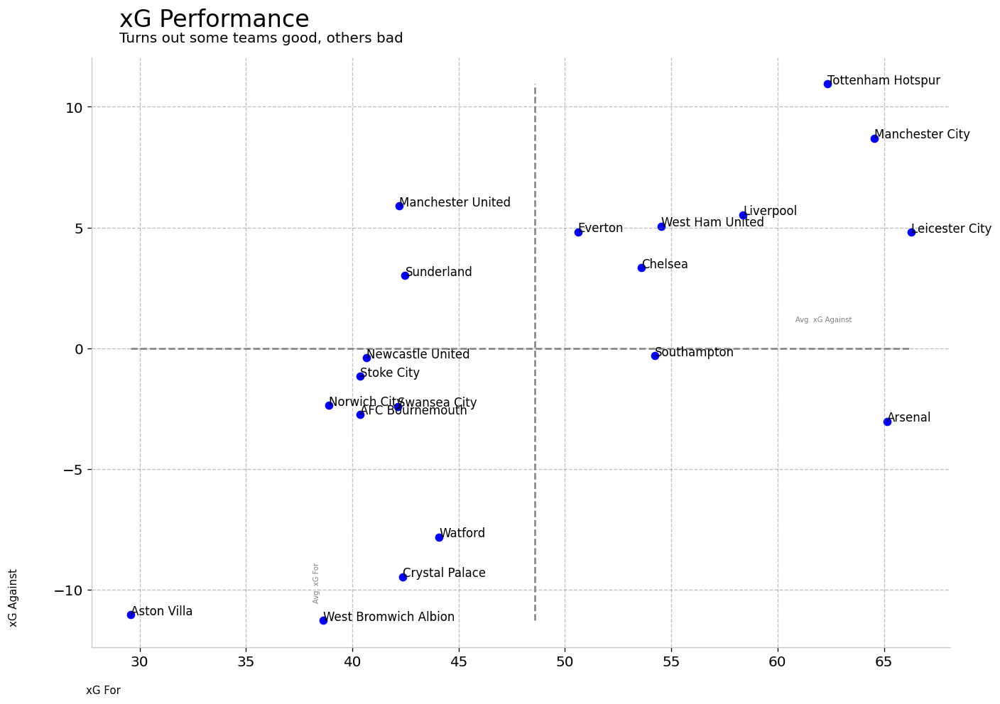

In [102]:
import matplotlib.patches as mpatches
plt.rcParams['font.family'] = 'sans-serif'
bgcol = 'white'  # White background

plt.figure(facecolor = bgcol)
fig, ax =  plt.subplots(figsize=(13,9),dpi = 120)
fig.set_facecolor(bgcol)
ax.set_facecolor(bgcol)
ax.scatter(team_summary['shot_statsbomb_xg'],team_summary['difference'], color='blue')

# Change plot spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_color('#ccc8c8')
ax.spines['bottom'].set_color('#ccc8c8')

# Change ticks
plt.tick_params(axis='x', labelsize=12, colors='black')
plt.tick_params(axis='y', labelsize=12, colors='black')

# Add average lines
plt.hlines(team_summary['difference'].mean(), team_summary['shot_statsbomb_xg'].min(), team_summary['shot_statsbomb_xg'].max(), color='grey', linestyles='dashed')
plt.vlines(team_summary['shot_statsbomb_xg'].mean(), team_summary['difference'].min(), team_summary['difference'].max(), color='grey', linestyles='dashed')

# Text

## Title & comment
fig.text(.15,.92,'xG Performance',size=20, color='black')
fig.text(.15,.90,'Turns out some teams good, others bad', size=12, color='black')

## Avg line explanation
plt.grid(color='grey', linestyle='dashed', alpha=0.5)
fig.text(.05,.14,'xG Against', size=9, color='black',rotation=90)
fig.text(.12,.05,'xG For', size=9, color='black')

## Axes titles
fig.text(.76,.535,'Avg. xG Against', size=6, color='grey')
fig.text(.325,.17,'Avg. xG For', size=6, color='grey',rotation=90)

for i in range(len(team_summary)):
    ax.annotate(team_summary['team_name'][i], (team_summary['shot_statsbomb_xg'][i], team_summary['difference'][i]), color='black')

plt.show()

<Figure size 640x480 with 0 Axes>

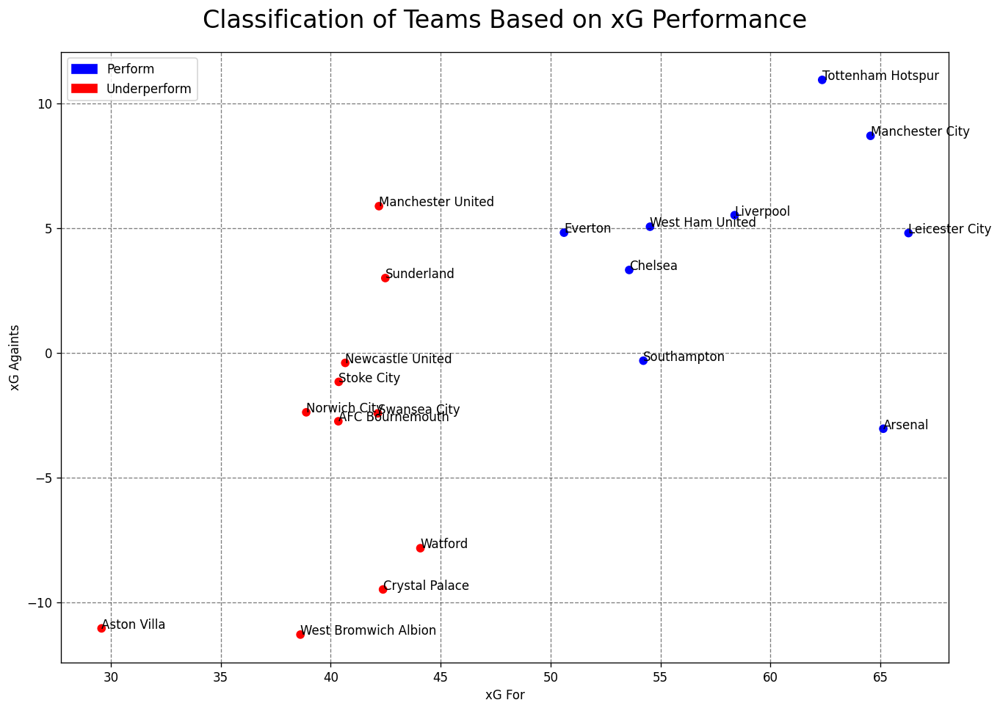

In [103]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

bgcol = 'white'

# Asumsikan team_summary adalah DataFrame Anda
team_summary['performance'] = ['perform' if x > team_summary['shot_statsbomb_xg'].mean() else 'underperform' for x in team_summary['shot_statsbomb_xg']]

X = team_summary[['shot_statsbomb_xg', 'difference']]  # fitur
y = team_summary['performance']  # target

# Membagi data menjadi set pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Membuat model Decision Tree
clf = DecisionTreeClassifier(random_state=42)

# Melatih model
clf.fit(X_train, y_train)

# Membuat scatter plot
plt.figure(facecolor = bgcol)
fig, ax =  plt.subplots(figsize=(13,9),dpi = 120)
fig.set_facecolor(bgcol)
ax.set_facecolor(bgcol)
colors = {'perform':'blue', 'underperform':'red'}
plt.scatter(team_summary['shot_statsbomb_xg'], team_summary['difference'], c=team_summary['performance'].map(colors))

# Menambahkan judul dan label
plt.title('Classification of Teams Based on xG Performance', size=20, pad= 20, color='black')
plt.xlabel('xG For', color='black')
plt.ylabel('xG Againts', color='black')
perform_patch = mpatches.Patch(color='blue', label='Perform')
underperform_patch = mpatches.Patch(color='red', label='Underperform')
plt.legend(handles=[perform_patch, underperform_patch])

# Mengubah warna sumbu dan grid
plt.tick_params(colors='black')
plt.grid(color='black', linestyle='dashed', alpha=0.5)

for i in range(len(team_summary)):
    plt.annotate(team_summary['team_name'].iloc[i], (team_summary['shot_statsbomb_xg'].iloc[i], team_summary['difference'].iloc[i]), color='black')

plt.show()

In [104]:
df_matches[3754165]['event'][df_matches[3754165]['event']['outcome_name'] == 'Goal']

,id,index,period,timestamp,minute,second,possession,duration,match_id,type_id,type_name,possession_team_id,possession_team_name,play_pattern_id,play_pattern_name,team_id,team_name,tactics_formation,player_id,player_name,position_id,position_name,pass_recipient_id,pass_recipient_name,pass_length,pass_angle,pass_height_id,pass_height_name,end_x,end_y,body_part_id,body_part_name,sub_type_id,sub_type_name,x,y,outcome_id,outcome_name,under_pressure,pass_cross,ball_recovery_recovery_failure,aerial_won,counterpress,out,off_camera,dribble_overrun,pass_assisted_shot_id,pass_shot_assist,shot_statsbomb_xg,shot_key_pass_id,technique_id,technique_name,goalkeeper_position_id,goalkeeper_position_name,pass_switch,pass_goal_assist,end_z,shot_first_time,foul_won_defensive,shot_one_on_one,pass_cut_back,dribble_nutmeg,block_deflection,foul_committed_advantage,foul_won_advantage,foul_committed_card_id,foul_committed_card_name,pass_no_touch,substitution_replacement_id,substitution_replacement_name,ball_recovery_offensive,pass_miscommunication,pass_deflected
368,2d9192d4-01e0-4aae-b543-540d6d8658b8,369,1,00:07:31.906000,7,31,18,0.438126,3754165,16,Shot,39,Manchester United,4,From Throw In,39,Manchester United,None,20039.0,Anthony Martial,16.0,Left Midfield,NaN,NaN,NaN,NaN,NaN,NaN,120.0,37.3,40.0,Right Foot,87.0,Open Play,112.9,28.3,97.0,Goal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.095508,db062497-5552-4d29-86b0-501b0a6d583a,91.0,Half Volley,NaN,NaN,NaN,NaN,0.0,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
653,18c22845-5df0-4d7e-b692-511d8a08ccfb,654,1,00:16:11.692000,16,11,35,1.104224,3754165,16,Shot,22,Leicester City,3,From Free Kick,22,Leicester City,None,3813.0,Wes Morgan,3.0,Right Center Back,NaN,NaN,NaN,NaN,NaN,NaN,120.0,37.0,37.0,Head,87.0,Open Play,113.5,44.5,97.0,Goal,1.0,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,0.140176,7ca8b960-60b6-42e7-8861-b99f60ab065d,93.0,Normal,NaN,NaN,NaN,NaN,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
mask_mu = (df_matches[3754165]['event'].type_name == 'Shot') & (df_matches[3754165]['event'].period	<= 4) & (df_matches[3754165]['event'].team_name	== 'Manchester United')
mask_leicester = (df_matches[3754165]['event'].type_name == 'Shot') & (df_matches[3754165]['event'].period	<= 4) & (df_matches[3754165]['event'].team_name	== 'Leicester City')
df_mu = df_matches[3754165]['event'][mask_mu]
df_leicester = df_matches[3754165]['event'][mask_leicester]

df_leicester['our_xg'] = df_leicester.apply(lambda row:calculate_xg_adv(row), axis=1)
df_mu['our_xg'] = df_mu.apply(lambda row:calculate_xg_adv(row), axis=1)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

Text(115, 15, 'Total Shots: 21, Total xG: 1.59, Actual Goals: 1')

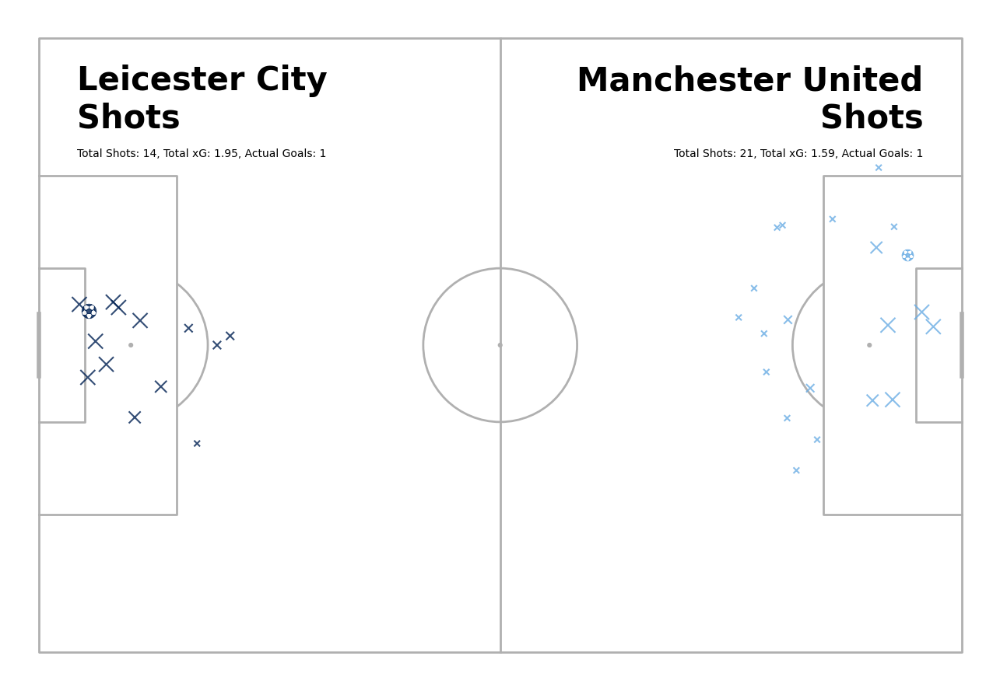

In [106]:
import matplotlib.pyplot as plt
pitch = Pitch(pitch_type='statsbomb')
fig, ax = pitch.draw(figsize=(13, 9))

mask_leicester_goal = (df_leicester['outcome_name'] == 'Goal')
mask_leicester_no_goal = (df_leicester['outcome_name'] != 'Goal')
mask_mu_goal = (df_mu['outcome_name'] == 'Goal')
mask_mu_no_goal = (df_mu['outcome_name'] != 'Goal')

# plot home no goal
sc1 = pitch.scatter(120-df_leicester[mask_leicester_no_goal].x, 80-df_leicester[mask_leicester_no_goal].y,
                    s=(df_leicester[mask_leicester_no_goal].our_xg * 1000),
                    c='#002153',
                    marker='x',
                    ax=ax, alpha=0.8)

# plot home goals
sc2 = pitch.scatter(120-df_leicester[mask_leicester_goal].x, 80-df_leicester[mask_leicester_goal].y,
                    s=(df_leicester[mask_leicester_goal].our_xg * 1000),
                    edgecolors='#002153',
                    linewidths=0.6,
                    c='white',
                    marker='football',
                    ax=ax, alpha=0.8)

# plot away no goals
sc3 = pitch.scatter(df_mu[mask_mu_no_goal].x, df_mu[mask_mu_no_goal].y,
                    s=(df_mu[mask_mu_no_goal].our_xg * 1000),
                    c='#6bade4',
                    marker='x',
                    ax=ax, alpha=0.8)

# plot Away goals
sc4 = pitch.scatter(df_mu[mask_mu_goal].x, df_mu[mask_mu_goal].y,
                    s=(df_mu[mask_mu_goal].our_xg * 1000),
                    edgecolors='#6bade4',
                    linewidths=0.6,
                    c='white',
                    marker='football',
                    ax=ax, alpha=0.8)

ax.text(x=5, y=8, s='Leicester City\nShots',
        size=30,
        color='#000000',
        va='center', ha='left', weight='bold')
ax.text(x=5, y=15, s='Total Shots: {}, Total xG: {}, Actual Goals: {}'.format(len(df_leicester),
                                                                                round(df_leicester.our_xg.sum(), 2),
                                                                                df_leicester[mask_leicester_goal].shape[0]),
        size=10,
        color='#000000',
        va='center', ha='left')

ax.text(x=115, y=8, s='Manchester United\nShots',
        size=30,
        color='#000000',
        va='center', ha='right', weight='bold')
ax.text(x=115, y=15, s='Total Shots: {}, Total xG: {}, Actual Goals: {}'.format(len(df_mu),
                                                                                round(df_mu.our_xg.sum(), 2),
                                                                                df_mu[mask_mu_goal].shape[0]),
        size=10,
        color='#000000',
        va='center', ha='right')

In [107]:
df_summary[df_summary['away_team_name'] == 'Leicester City']

,match_id,match_date,match_week,home_team_name,away_team_name,home_goal,home_xg,home_xg_sb,away_goal,away_xg,away_xg_sb
21,3754146,2015-09-19,6,Stoke City,Leicester City,2,0.922018,1.324059,2,1.763954,1.611006
40,3754006,2015-10-31,11,West Bromwich Albion,Leicester City,2,2.169011,1.987063,3,1.390722,1.679065
41,3754023,2015-08-29,4,AFC Bournemouth,Leicester City,1,0.279505,0.300446,1,0.899872,0.828728
60,3754085,2015-12-05,15,Swansea City,Leicester City,0,1.162120,1.047635,3,1.971530,2.548385
100,3754166,2015-12-19,17,Everton,Leicester City,2,1.764502,1.691042,3,2.553014,2.370729
101,3754211,2015-11-21,13,Newcastle United,Leicester City,0,0.754207,0.430049,3,2.375417,3.173120
145,3754335,2015-10-03,8,Norwich City,Leicester City,1,1.601520,1.288597,2,2.530696,3.519109
159,3754302,2015-10-17,9,Southampton,Leicester City,2,1.543705,1.364069,2,2.544044,2.111764
163,3754343,2015-12-26,18,Liverpool,Leicester City,1,1.779276,1.777294,0,0.988752,0.801469
178,3754203,2015-08-15,2,West Ham United,Leicester City,1,0.822915,0.806373,2,1.134579,1.215113


In [108]:
df_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   match_id        380 non-null    int64         
 1   match_date      380 non-null    datetime64[ns]
 2   match_week      380 non-null    int64         
 3   home_team_name  380 non-null    object        
 4   away_team_name  380 non-null    object        
 5   home_goal       380 non-null    int64         
 6   home_xg         380 non-null    float64       
 7   home_xg_sb      380 non-null    float64       
 8   away_goal       380 non-null    int64         
 9   away_xg         380 non-null    float64       
 10  away_xg_sb      380 non-null    float64       
dtypes: datetime64[ns](1), float64(4), int64(4), object(2)
memory usage: 32.8+ KB


In [109]:
#basic data wrangling

data1 = df_summary[df_summary["home_team_name"] == "Leicester City"]
data2 = df_summary[df_summary["away_team_name"] == "Leicester City"]

df1 = data1[["home_team_name", "home_xg", "match_date"]]
df2 = data2[["away_team_name", "away_xg", "match_date"]]
df3 = data1[["away_team_name", "away_xg", "match_date"]]
df4 = data2[["home_team_name", "home_xg", "match_date"]]

In [110]:
#renaming columns

df1 = df1.rename(columns= {"home_team_name": "Team", "home_xg": "xG"})
df2 = df2.rename(columns= {"away_team_name": "Team", "away_xg": "xG"})
df3 = df3.rename(columns= {"away_team_name": "Team", "away_xg": "xGA"})
df4 = df4.rename(columns= {"home_team_name": "Team", "home_xg": "xGA"})

In [111]:
#basic merging and selection

data1 = pd.concat([df1, df2], axis = 0)
data2 = pd.concat([df3, df4], axis = 0)
data2 = data2.drop(["match_date", "Team"], axis = 1)

data = pd.concat([data1, data2], axis = 1)
data = data.dropna()
data["No"] = np.arange(data.shape[0])

roll_avg = 15

data["xG"] = data["xG"].rolling(roll_avg, min_periods=1).mean()
data["xGA"] = data["xGA"].rolling(roll_avg, min_periods=1).mean()
data.tail()

,Team,xG,match_date,xGA,No
309,Leicester City,1.685602,2016-05-15,1.339556,33
319,Leicester City,1.691549,2016-01-16,1.351304,34
324,Leicester City,1.687988,2016-02-14,1.472496,35
337,Leicester City,1.745301,2016-03-05,1.521468,36
338,Leicester City,1.719193,2016-02-06,1.564155,37


In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 0 to 338
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Team        38 non-null     object        
 1   xG          38 non-null     float64       
 2   match_date  38 non-null     datetime64[ns]
 3   xGA         38 non-null     float64       
 4   No          38 non-null     int32         
dtypes: datetime64[ns](1), float64(2), int32(1), object(1)
memory usage: 1.6+ KB


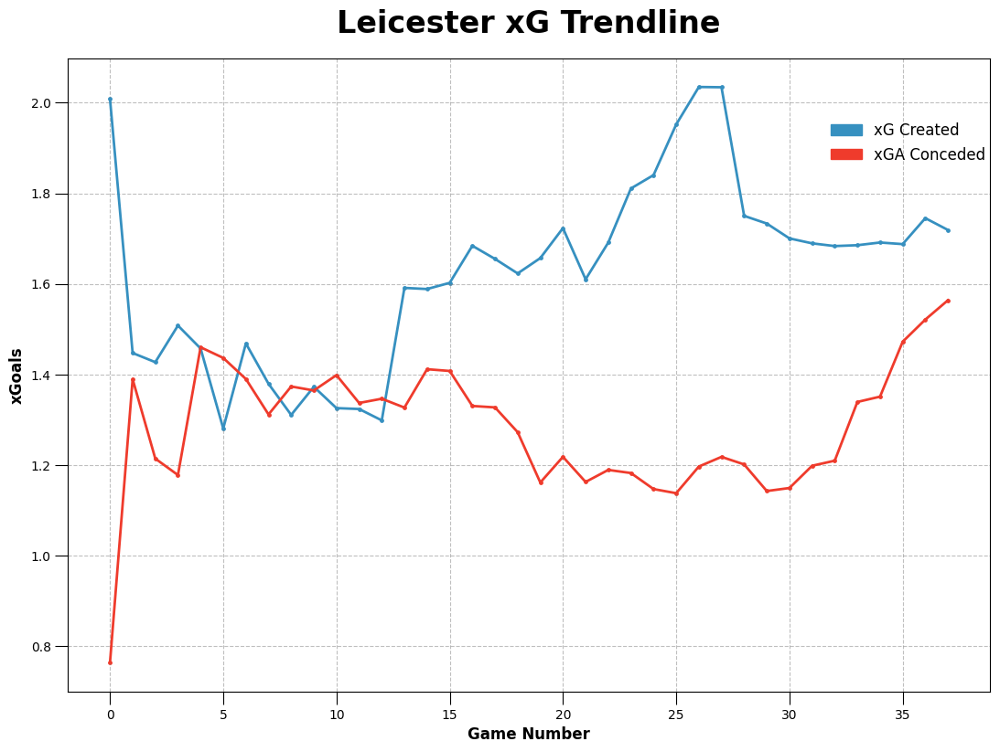

In [113]:
xg = mpatches.Patch(color = "#3690c0", label = "xG Created")
xga = mpatches.Patch(color = "#ef3b2c", label = "xGA Conceded")

plt.figure(facecolor = "white")
plt.plot(data["No"], data["xG"], color = "#3690c0", linewidth = 2)
plt.plot(data["No"], data["xGA"], color = "#ef3b2c", linewidth = 2)
plt.scatter(data["No"], data["xG"], color = "#3690c0", s = 6)
plt.scatter(data["No"], data["xGA"], color = "#ef3b2c", s = 6)
plt.title("Leicester xG Trendline", color = "black", fontweight = "bold", size = 24, pad = 20)
plt.xlabel("Game Number", color = "black", fontweight = "bold", size = 12)
plt.ylabel("xGoals", color = "black", fontweight = "bold", size = 12)
plt.grid(color = "grey", linestyle = "dashed", alpha = 0.5)
leg = plt.legend(handles = [xg, xga], frameon = False, prop = {"size": 12}, bbox_to_anchor = (1.01, 0.92))

for text in leg.get_texts():
    text.set_color("black")

ax = plt.gca()
ax.set_facecolor("white")
ax.tick_params(axis='x', colors="black", size = 10)
ax.tick_params(axis='y', colors="black", size = 10)

fig = plt.gcf()
fig.set_size_inches(13, 9)

In [114]:
# we'll take the location where the shots ended
a = pd.DataFrame(columns=['end_y', 'end_z', 'outcome_name'])

for id in df_match['match_id']:
  mask_shot = (df_matches[id]['event'].type_name == 'Shot') & (df_matches[id]['event'].period	<= 4)
  shots_temp = df_matches[id]['event'].loc[mask_shot, ['end_y', 'end_z', 'outcome_name']]
  a = pd.concat([a, shots_temp]).reset_index(drop=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\3409755853.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  a = pd.concat([a, shots_temp]).reset_index(drop=True)


In [115]:
a.outcome_name.unique()

array(['Blocked', 'Off T', 'Wayward', 'Post', 'Saved', 'Goal',
       'Saved Off Target', 'Saved to Post'], dtype=object)

In [116]:
a[a.outcome_name == 'Post']

,end_y,end_z,outcome_name
5,36.0,1.3,Post
112,35.9,0.5,Post
148,36.2,0.6,Post
228,43.2,2.8,Post
314,39.9,2.8,Post
...,...,...,...
9647,42.5,2.7,Post
9739,43.5,0.3,Post
9774,39.4,2.8,Post
9782,38.1,3.0,Post


In [117]:
mask_on_target = (a.end_y <= 44) & (a.end_y >= 36) & (a.end_z <= 2.8)

In [118]:
a = a[mask_on_target].reset_index(drop=True)

In [119]:
a['goal'] = a.apply(lambda row:1 if row['outcome_name']=='Goal' else 0, axis=1)

In [120]:
a['end_y_center'] = a.apply(lambda row:abs(40-row['end_y']), axis=1)

In [121]:
a['end_z_center'] = a.apply(lambda row:abs(1.4-row['end_z']), axis=1)

In [122]:
pip install altair

In [123]:
import altair as alt

In [124]:
fig = alt.Chart(a).mark_point().encode(x='end_y_center',y='goal')

fig + fig.transform_regression('end_y_center','goal').mark_line()

alt.LayerChart(...)

In [125]:
fig = alt.Chart(a).mark_point().encode(x='end_z_center',y='goal')

fig + fig.transform_regression('end_z_center','goal').mark_line()

alt.LayerChart(...)

In [126]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score

X = a[['end_y_center', 'end_z_center']]
y = a['goal']

# Membuat dan melatih model Decision Tree
xgot_model = DecisionTreeClassifier()
xgot_model.fit(X, y)

# Memprediksi probabilitas kelas dengan model Decision Tree
y_pred_tree = xgot_model.predict_proba(X)[:, 1]

# Menghitung skor R^2
r2_tree = r2_score(y, y_pred_tree)
print(f"R^2 score for Decision Tree model: {r2_tree}")

R^2 score for Decision Tree model: 0.2664749521971903


In [127]:
import pickle
filename = 'xgot_model.sav'
pickle.dump(xgot_model, open(filename, 'wb'))

In [128]:
# define function to calculate xG
def calculate_xgot(row):
  if (row.end_y <= 44) & (row.end_y >= 36) & (row.end_z <= 2.8): # if on target
    end_y_center = abs(40-row['end_y'])
    end_z_center = abs(1.4-row['end_z'])
    X = [[end_y_center, end_z_center]]
    xgot = xgot_model.predict_proba(X)[:, 1][0]
    return xgot
  else:
    return np.nan

In [129]:
df_summary = df_match[['match_id', 'home_team_name', 'away_team_name']].copy()

home_goal = []
home_xg = []
home_xg_sb = []
home_xgot = []

away_goal = []
away_xg = []
away_xg_sb = []
away_xgot = []

for i, id in enumerate(df_match.match_id):
  df_evaluate = df_matches[id]['event'][df_matches[id]['event']['type_name'] == 'Shot']

  # take only open play
  evaluate_mask = (df_evaluate.type_name == 'Shot') & (df_evaluate.period	<= 4)
  df_evaluate = df_evaluate[evaluate_mask]

  # calculate xg per shot
  df_evaluate['our_xg'] = df_evaluate.apply(lambda row:calculate_xg_adv(row), axis=1)
  df_evaluate['our_xgot'] = df_evaluate.apply(lambda row:calculate_xgot(row), axis=1)

  # home team
  df_home = df_evaluate[df_evaluate.team_name == df_match['home_team_name'][i]]
  home_goal.append(len(df_home[df_home.outcome_name == 'Goal']))
  home_xg.append(df_home.our_xg.sum())
  home_xg_sb.append(df_home.shot_statsbomb_xg.sum())
  home_xgot.append(df_home.our_xgot.sum())

  # away team
  df_away = df_evaluate[df_evaluate.team_name == df_match['away_team_name'][i]]
  away_goal.append(len(df_away[df_away.outcome_name == 'Goal']))
  away_xg.append(df_away.our_xg.sum())
  away_xg_sb.append(df_away.shot_statsbomb_xg.sum())
  away_xgot.append(df_away.our_xgot.sum())

df_summary['home_goal'] = home_goal
df_summary['home_xg'] = home_xg
df_summary['home_xg_sb'] = home_xg_sb
df_summary['home_xgot'] = home_xgot

df_summary['away_goal'] = away_goal
df_summary['away_xg'] = away_xg
df_summary['away_xg_sb'] = away_xg_sb
df_summary['away_xgot'] = away_xgot

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

In [130]:
df_summary.head(10)

,match_id,home_team_name,away_team_name,home_goal,home_xg,home_xg_sb,home_xgot,away_goal,away_xg,away_xg_sb,away_xgot
0,3754058,Leicester City,AFC Bournemouth,0,2.008681,2.822871,0.475000,0,0.764097,0.936503,0.000000
1,3754245,West Bromwich Albion,Sunderland,1,1.401615,1.476454,0.500000,0,0.922018,0.670351,0.333333
2,3754136,Newcastle United,Aston Villa,1,1.300416,1.085261,1.250000,1,0.709016,0.380228,1.450000
3,3754037,Everton,AFC Bournemouth,2,0.959295,0.890678,1.609557,1,1.379070,1.429667,0.772727
4,3754039,Crystal Palace,Watford,1,1.204378,1.142375,1.358730,2,1.692391,1.703768,1.196970
5,3754041,Arsenal,Aston Villa,3,2.102825,2.922745,1.566667,0,0.614973,0.301122,0.166667
6,3754042,West Bromwich Albion,Liverpool,1,1.625885,1.608317,0.833333,1,0.576661,0.525335,0.661538
7,3754043,Tottenham Hotspur,AFC Bournemouth,3,1.357239,1.533226,2.396032,0,0.376635,0.254451,0.000000
8,3754045,Leicester City,Manchester City,0,0.886562,0.888164,0.333333,0,2.015431,1.695596,2.369444
9,3754048,Crystal Palace,Everton,0,1.974418,2.665427,1.694444,0,0.822915,0.592142,2.377778


In [131]:
new_features = ['team_name', 'x', 'y', 'outcome_name', 'sub_type_name', 'body_part_name', 'under_pressure', 'technique_name', 'shot_statsbomb_xg', 'end_y', 'end_z']
df_shot_team = pd.DataFrame(columns=new_features)

for id in df_match['match_id']:
  mask_shot = (df_matches[id]['event'].type_name == 'Shot') & (df_matches[id]['event'].period	<= 4)
  shots_temp = df_matches[id]['event'].loc[mask_shot, new_features]
  df_shot_team = pd.concat([df_shot_team, shots_temp]).reset_index(drop=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\2280052006.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_shot_team = pd.concat([df_shot_team, shots_temp]).reset_index(drop=True)


In [132]:
df_shot_team.head()

,team_name,x,y,outcome_name,sub_type_name,body_part_name,under_pressure,technique_name,shot_statsbomb_xg,end_y,end_z
0,AFC Bournemouth,107.1,26.6,Blocked,Open Play,Right Foot,NaN,Normal,0.020838,30.1,NaN
1,AFC Bournemouth,113.7,54.0,Blocked,Open Play,Right Foot,NaN,Normal,0.034462,52.6,NaN
2,Leicester City,115.7,50.5,Off T,Open Play,Left Foot,1.0,Overhead Kick,0.035481,43.3,3.6
3,AFC Bournemouth,113.9,38.6,Off T,Open Play,Head,NaN,Normal,0.383711,46.0,1.2
4,Leicester City,96.7,47.2,Wayward,Open Play,Right Foot,NaN,Half Volley,0.036740,40.1,NaN


In [133]:
mask_leicester = df_shot_team['team_name'] == "Leicester City"
df_leicester = df_shot_team.loc[mask_leicester]

In [134]:
df_leicester.head()

,team_name,x,y,outcome_name,sub_type_name,body_part_name,under_pressure,technique_name,shot_statsbomb_xg,end_y,end_z
2,Leicester City,115.7,50.5,Off T,Open Play,Left Foot,1.0,Overhead Kick,0.035481,43.3,3.6
4,Leicester City,96.7,47.2,Wayward,Open Play,Right Foot,NaN,Half Volley,0.036740,40.1,NaN
5,Leicester City,111.3,38.7,Post,Open Play,Right Foot,NaN,Normal,0.575428,36.0,1.3
7,Leicester City,112.1,32.8,Off T,Open Play,Head,1.0,Normal,0.047259,48.3,1.0
9,Leicester City,114.2,27.2,Wayward,Open Play,Left Foot,NaN,Normal,0.111973,50.5,NaN


In [135]:
df_shot_team['our_xg'] = df_shot_team.apply(lambda row:calculate_xg_adv(row), axis=1)
df_shot_team['our_xgot'] = df_shot_team.apply(lambda row:calculate_xgot(row), axis=1)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_22156\230360434.py:12: DeprecationWarning: `np.math` is a deprecated alias for the standard libra

In [136]:
df_shot_team['goal'] = df_shot_team.apply(lambda row:1 if row['outcome_name'] == 'Goal' else 0, axis=1)

In [137]:
team_summary = df_shot_team.groupby('team_name')[['our_xg', 'our_xgot', 'shot_statsbomb_xg', 'goal']].sum().reset_index()

In [138]:
import altair as alt
alt.Chart(team_summary).mark_circle(size=60).encode(
    x='our_xgot:Q',
    y='our_xg:Q',
    color=alt.Color('goal', scale=alt.Scale(range=["#ff8000", "#00b020"])),
    tooltip=['team_name', 'our_xg', 'our_xgot', 'shot_statsbomb_xg', 'goal']
).interactive()

alt.Chart(...)

In [139]:
alt.Chart(team_summary).mark_circle(size=60).encode(
    x='our_xgot:Q',
    y='shot_statsbomb_xg:Q',
    color=alt.Color('goal', scale=alt.Scale(range=["#ff8000", "#00b020"])),
    tooltip=['team_name', 'our_xg', 'our_xgot', 'shot_statsbomb_xg', 'goal']
).interactive()

alt.Chart(...)

In [140]:
mask_leicester = df_shot_team['team_name'] == "Leicester City"
df_leicester = df_shot_team.loc[mask_leicester]

In [141]:
df_leicester.head()

,team_name,x,y,outcome_name,sub_type_name,body_part_name,under_pressure,technique_name,shot_statsbomb_xg,end_y,end_z,our_xg,our_xgot,goal
2,Leicester City,115.7,50.5,Off T,Open Play,Left Foot,1.0,Overhead Kick,0.035481,43.3,3.6,0.030396,NaN,0
4,Leicester City,96.7,47.2,Wayward,Open Play,Right Foot,NaN,Half Volley,0.036740,40.1,NaN,0.030396,NaN,0
5,Leicester City,111.3,38.7,Post,Open Play,Right Foot,NaN,Normal,0.575428,36.0,1.3,0.188317,0.0,0
7,Leicester City,112.1,32.8,Off T,Open Play,Head,1.0,Normal,0.047259,48.3,1.0,0.188317,NaN,0
9,Leicester City,114.2,27.2,Wayward,Open Play,Left Foot,NaN,Normal,0.111973,50.5,NaN,0.030396,NaN,0


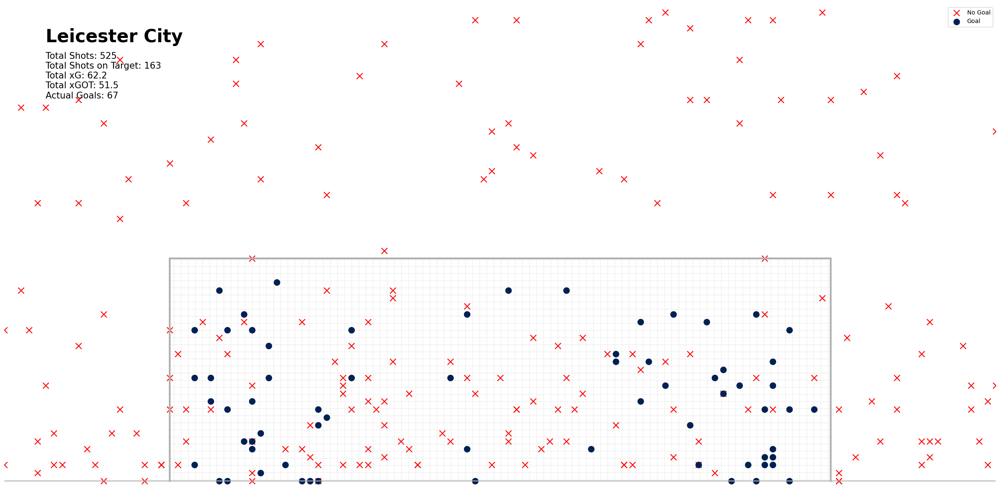

In [142]:
from matplotlib.patches import Rectangle

#Create figure
fig=plt.figure()
fig.set_size_inches(30, 15)

#Goal post lines
plt.plot([34,46],[0,0], color=pitch.line_color, linewidth=1.5)
plt.plot([36,44],[2.8,2.8], color=pitch.line_color, linewidth=3)
plt.plot([44,44],[0,2.8], color=pitch.line_color, linewidth=3)
plt.plot([36,36],[0,2.8], color=pitch.line_color, linewidth=3)
#Goal net
plt.gca().add_patch(Rectangle((36, 0), 8, 2.8, fill=False, edgecolor=pitch.line_color, hatch='+', alpha=0.2))

#Tidy Axes
plt.axis('off')

goal_mask = df_leicester.outcome_name == 'Goal'
no_goal_mask = df_leicester.outcome_name != 'Goal'
on_target_mask = (df_leicester.end_y <= 44) & (df_leicester.end_y >= 36) & (df_leicester.end_z <= 2.8)
sc1 = plt.scatter(df_leicester[no_goal_mask].end_y, df_leicester[no_goal_mask].end_z, s=100,
                    marker='x', color='red', label='No Goal')
sc2 = plt.scatter(df_leicester[goal_mask].end_y, df_leicester[goal_mask].end_z, s=100,
                    marker='o', color='#002153', label='Goal')


plt.text(x=34.5, y=5.7, s="Leicester City", color='#000000', fontsize=30, weight="bold", ha='left', va='top')
plt.text(x=34.5, y=5.4, s='Total Shots: {}\nTotal Shots on Target: {}\nTotal xG: {}\nTotal xGOT: {}\nActual Goals: {}'.format(len(df_leicester),
                                                                                                                len(df_leicester[on_target_mask]),
                                                                                         round(df_leicester.our_xg.sum(), 2),
                                                                                         round(df_leicester.our_xgot.sum(), 2),
                                                                                         df_leicester[goal_mask].shape[0]),
              size=15,
              color='#000000',
              va='top', ha='left')

plt.ylim(ymin=-0.2, ymax=6)
plt.xlim(xmin=34, xmax=46)
plt.legend(labelcolor='#000000')

plt.show()